Import training and testing data for the rating head task.

{train, test}\_images: contains the path of each image
{train, test}\_scores: contains the user ratings of each image


In [1]:
import tensorflow as tf
import csv

data_folder = '../../Calista/website-aesthetics-datasets-master/rating-based-dataset/preprocess/'

train_data_path = data_folder + 'train_means_list.csv'
test_data_path = data_folder + 'test_list.csv'
images_path = data_folder + 'resized'

def get_scores(scores_path):

    images = []
    scores = []

    with open(scores_path) as csv_file:
        csv_reader = csv.reader(csv_file, delimiter=',')
        line_count = 0

        for row in csv_reader:
            if line_count == 0:

                line_count += 1
            else:

                scores.append(float(row[1]))
                line_count += 1
                image_name = row[0]

                images.append(images_path + image_name)

    return (images, scores)

train_images, train_scores = get_scores(train_data_path)
test_images, test_scores = get_scores(test_data_path)

2024-08-12 11:44:52.125358: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-12 11:44:52.125404: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-12 11:44:52.126481: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-08-12 11:44:52.132222: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-08-12 11:44:52.758704: W tensorflow/compiler/tf2

Shuffle the training set


In [2]:
import random
import numpy as np
import os

# np.random.seed(2000)
seed_value = 400

# 402 -> Pearson Correlation: 0.7565 , Comparison Accuracy: 0.7037 (lab)
# Seed with Pearson Correlation >= 0.78: 414  Pearson Correlation: 0.8033  Comparison Accuracy: 0.6561

random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

os.environ['TF_DETERMINISTIC_OPS'] = '1'

temp = list(zip(train_images, train_scores))
random.shuffle(temp)

train_images, train_scores = zip(*temp)


Display the first 3 images to make sure everything is ok.


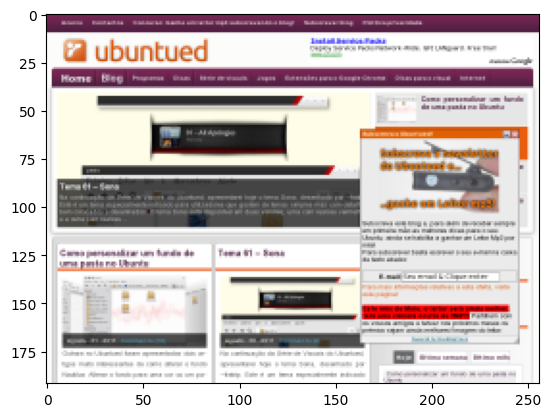

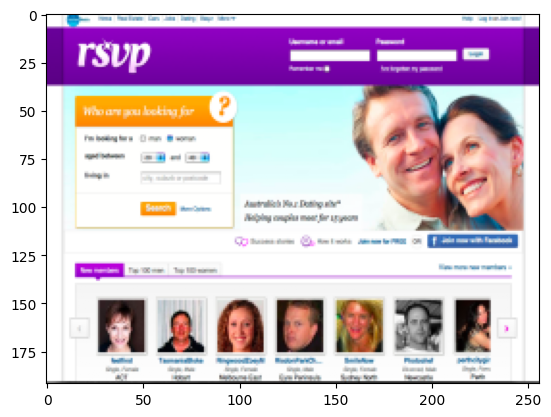

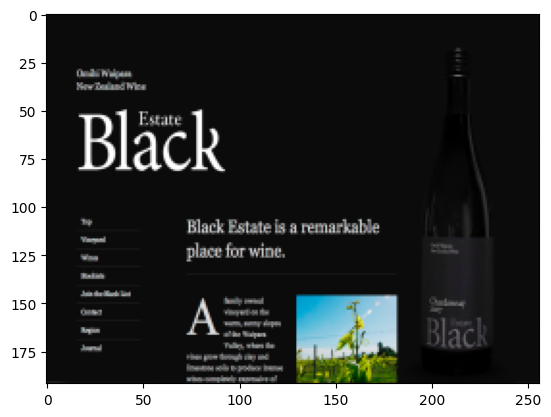

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline

import matplotlib.image as mping
for ima in train_images[0:3]:
  img = mping.imread(ima)
  imgplot = plt.imshow(img)
  plt.show()

Read the images as numpy arrays


In [4]:
import cv2

width = 256
height = 192
channels = 3

def read_and_process_images(list_of_images):
  X = []

  for image in list_of_images:

    # images are already resized
    # X.append(cv2.resize(cv2.imread(image, cv2.IMREAD_COLOR), (width, height),
    #                     interpolation=cv2.INTER_AREA))

    X.append(cv2.imread(image, cv2.IMREAD_COLOR))

  return X


X_train = np.array(read_and_process_images(train_images))
y_train = np.array(train_scores)

X_val = np.array(read_and_process_images(test_images))
y_val = np.array(test_scores)

Display the first 3 images to make sure everything is ok


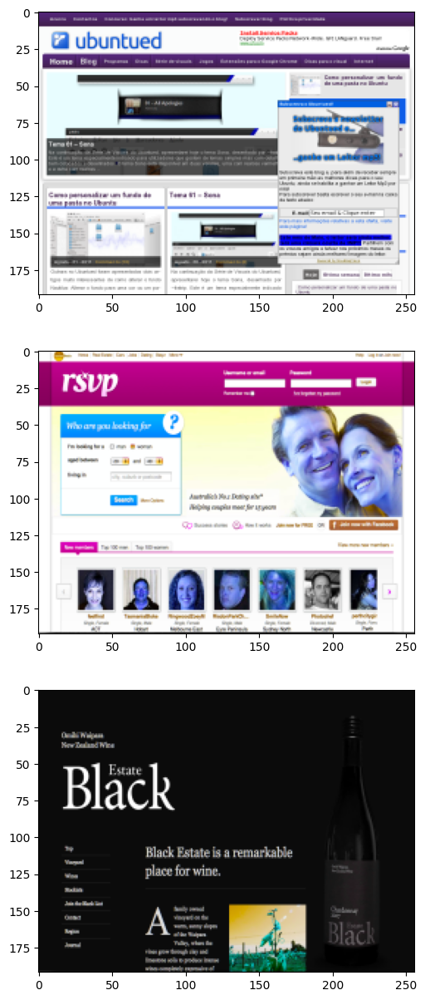

In [5]:
plt.figure(figsize=(25,15))
columns = 3

for i in range(columns):
  plt.subplot(columns, 1, i+1)
  plt.imshow(X_train[i])

Display shapes to check everything is ok


In [6]:
ntrain = len(X_train)
nval = len(X_val)

print('Shape of rating_X_train is: ', X_train.shape)
print('Shape of rating_X_val is: ', X_val.shape)
print('Shape of rating_y_train is: ', y_train.shape)
print('Shape of rating_y_val is: ', y_val.shape)

Shape of rating_X_train is:  (300, 192, 256, 3)
Shape of rating_X_val is:  (98, 192, 256, 3)
Shape of rating_y_train is:  (300,)
Shape of rating_y_val is:  (98,)


Import training and testing data for the comparison head task.

{train, test}\_image_pairs: contains the path of each pair of images
{train, test}\_labels: contains the labels of each image image, indicating the more aesthetic one.


In [7]:
# New image map folder paths
image_map_folder = 'image_map/'
train_pairs_csv = image_map_folder + 'train_image_pairs.csv'
test_pairs_csv = image_map_folder + 'test_image_pairs.csv'

# Function to get image pairs and labels from CSV
def get_image_pairs_and_labels(pairs_csv_path):
    image_pairs = []
    labels = []
    with open(pairs_csv_path) as csv_file:
        csv_reader = csv.reader(csv_file, delimiter=',')
        next(csv_reader)  # Skip header
        for row in csv_reader:
            image_path1 = row[0]
            image_path2 = row[1]
            label = int(row[2])
            image_pairs.append((image_path1, image_path2))
            labels.append(label)
    return image_pairs, labels

# Get training and testing image pairs and labels
train_image_pairs, train_labels = get_image_pairs_and_labels(train_pairs_csv)
test_image_pairs, test_labels = get_image_pairs_and_labels(test_pairs_csv)

# Print some samples to verify
print(f"Training images: {train_images[:5]}")
print(f"Training scores: {train_scores[:5]}")
print(f"Training image pairs: {train_image_pairs[:5]}")
print(f"Training labels: {train_labels[:5]}")
print(f"Testing images: {test_images[:5]}")
print(f"Testing scores: {test_scores[:5]}")
print(f"Testing image pairs: {test_image_pairs[:5]}")
print(f"Testing labels: {test_labels[:5]}")

print(f"Training pairs: {len(train_image_pairs)}")
print(f"Testing pairs: {len(test_image_pairs)}")

Training images: ('../../Calista/website-aesthetics-datasets-master/rating-based-dataset/preprocess/resized/foreign_resized/40.png', '../../Calista/website-aesthetics-datasets-master/rating-based-dataset/preprocess/resized/english_resized/318.png', '../../Calista/website-aesthetics-datasets-master/rating-based-dataset/preprocess/resized/english_resized/334.png', '../../Calista/website-aesthetics-datasets-master/rating-based-dataset/preprocess/resized/english_resized/274.png', '../../Calista/website-aesthetics-datasets-master/rating-based-dataset/preprocess/resized/english_resized/144.png')
Training scores: (4.153169014084507, 4.5131856540084385, 6.480171489817792, 5.536177105831533, 3.7626931567328916)
Training image pairs: [('../../Calista/website-aesthetics-datasets-master/comparison-based-dataset/resized_images/250.png', '../../Calista/website-aesthetics-datasets-master/comparison-based-dataset/resized_images/130.png'), ('../../Calista/website-aesthetics-datasets-master/comparison-b

Shuffle the comparison training set


In [8]:

temp = list(zip(train_image_pairs, train_labels))
random.shuffle(temp)

train_image_pairs, train_labels = zip(*temp)

Display the first 3 pairs to make sure everything is ok.


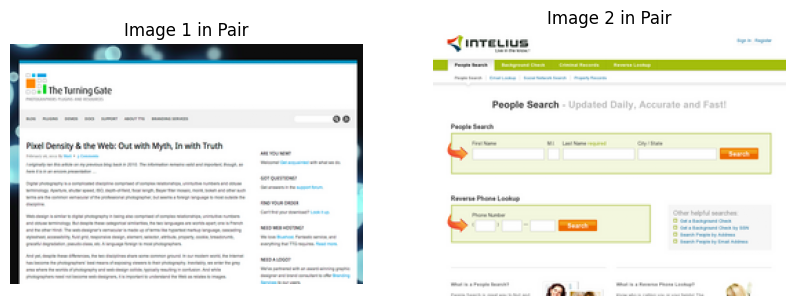

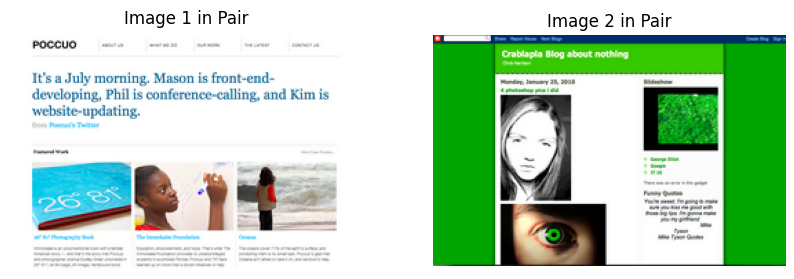

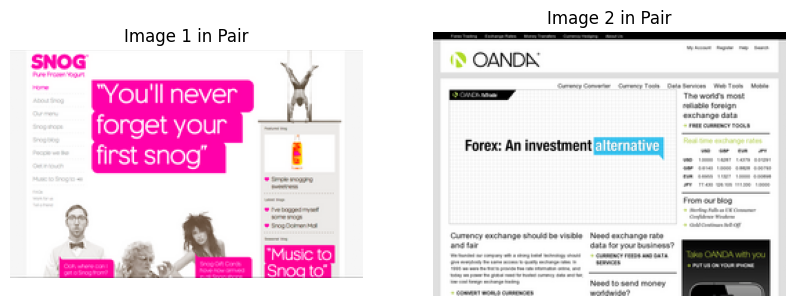

In [9]:
  # Display 3 random pairs of images side by side
for pair in train_image_pairs[:3]:
    img1 = mping.imread(pair[0])  # Read the first image in the pair
    img2 = mping.imread(pair[1])  # Read the second image in the pair

    # Create a figure with two subplots side by side
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # Plot the first image on the first subplot
    axs[0].imshow(img1)
    axs[0].set_title('Image 1 in Pair')
    axs[0].axis('off')  # Hide axes

    # Plot the second image on the second subplot
    axs[1].imshow(img2)
    axs[1].set_title('Image 2 in Pair')
    axs[1].axis('off')  # Hide axes

    # Display the plot
    plt.show()

Read the images as numpy arrays


In [10]:
def read_and_process_image_pairs(list_of_image_pairs):
    X = []

    for image1, image2 in list_of_image_pairs:
        img1 = cv2.imread(image1, cv2.IMREAD_COLOR)
        img2 = cv2.imread(image2, cv2.IMREAD_COLOR)

        #  Resize images if needed
        img1 = cv2.resize(img1, (width, height), interpolation=cv2.INTER_AREA)
        img2 = cv2.resize(img2, (width, height), interpolation=cv2.INTER_AREA)
                # Print the dimensions of each image
        # print(f"Image1 ({image1}) shape: {img1.shape}")
        # print(f"Image2 ({image2}) shape: {img2.shape}")

        
        # img1 = cv2.resize(img1, (width, height), interpolation=cv2.INTER_CUBIC)
        # img2 = cv2.resize(img2, (width, height), interpolation=cv2.INTER_CUBIC)
        # img1 = cv2.resize(img1, (width, height), interpolation=cv2.INTER_LINEAR)
        # img2 = cv2.resize(img2, (width, height), interpolation=cv2.INTER_LINEAR)
        # img1 = cv2.resize(img1, (width, height), interpolation=cv2.INTER_LANCZOS4)
        # img2 = cv2.resize(img2, (width, height), interpolation=cv2.INTER_LANCZOS4)

        #         # Maintain aspect ratio by padding
        # img1 = maintain_aspect_ratio_and_resize(img1, width, height)
        # img2 = maintain_aspect_ratio_and_resize(img2, width, height)

        X.append((img1, img2))

    return X

 # Process training image pairs
X_pairs_train = np.array(read_and_process_image_pairs(train_image_pairs))
y_pairs_train = np.array(train_labels)

# Process validation image pairs
X_pairs_val = np.array(read_and_process_image_pairs(test_image_pairs))
y_pairs_val = np.array(test_labels)

# print(f"training pairs shape:   ",X_pairs_train.shape )

Display the first 3 images to make sure everything is okay


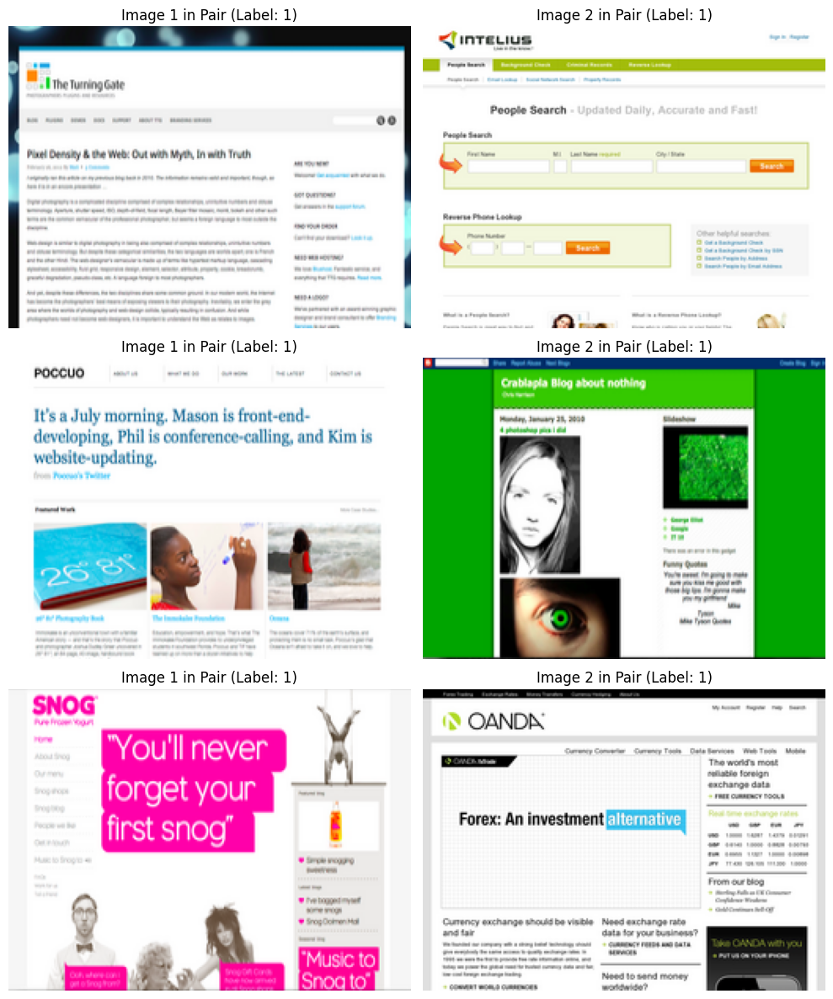

In [11]:
# Number of pairs to display
num_pairs_to_display = 3

# Create subplots
fig, axes = plt.subplots(num_pairs_to_display, 2, figsize=(10, 4 * num_pairs_to_display))

for i in range(num_pairs_to_display):
    img1, img2 = X_pairs_train[i]
    label = y_pairs_train[i]

    # Display the first image in the pair
    axes[i, 0].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title(f'Image 1 in Pair (Label: {label})')
    axes[i, 0].axis('off')

    # Display the second image in the pair
    axes[i, 1].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title(f'Image 2 in Pair (Label: {label})')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

Get the weights of the pretrained model. This model is pretrained on the Flickr style dataset (containing 80 K images) for image style recognition task. It aims at the artistic aspect recognition of photographs and it is fine-tuned from another network which has been pretrained on the ImageNet dataset for object recognition task.


In [12]:
# import tensorflow as tf
# import keras
# print("TensorFlow version:", tf.__version__)
# print("Keras version:", keras.__version__)
# from keras import layers
# from keras import models
# from keras import optimizers
# from keras import regularizers
# from keras import initializers
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
# from tensorflow.keras.preprocessing.image import img_to_array, load_img

# from tensorflow.keras import layers, models, optimizers, regularizers, initializers
# from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
import h5py

def traverse_datasets(hdf_file):

    def h5py_dataset_iterator(g, prefix=''):
        for key in g.keys():
            item = g[key]
            path = f'{prefix}/{key}'    
            if isinstance(item, h5py.Dataset): # test for dataset
                yield (path, item)
            elif isinstance(item, h5py.Group): # test for group (go down)
                yield from h5py_dataset_iterator(item, path)

    with h5py.File(hdf_file, 'r') as f:
        for path, _ in h5py_dataset_iterator(f):
            yield path

weights = {}
filename = '../../Calista/pretrainedModels/flickr_style.h5'

with h5py.File(filename, 'r') as f:
    for dset in traverse_datasets(filename):
        print('Path:', dset)
        # print('Shape:', f[dset].shape)
        # print('Data type:', f[dset].dtype)
        weights[dset] = f[dset][:]

conv1_bias = weights['/conv1/conv1/bias:0']
conv1_kernel = weights['/conv1/conv1/kernel:0']
conv2_bias = weights['/conv2/conv2/bias:0']
conv2_kernel = weights['/conv2/conv2/kernel:0']
conv3_bias = weights['/conv3/conv3/bias:0']
conv3_kernel = weights['/conv3/conv3/kernel:0']
conv4_bias = weights['/conv4/conv4/bias:0']
conv4_kernel = weights['/conv4/conv4/kernel:0']
conv5_bias = weights['/conv5/conv5/bias:0']
conv5_kernel = weights['/conv5/conv5/kernel:0']


Path: /conv1/conv1/bias:0
Path: /conv1/conv1/kernel:0
Path: /conv2/conv2/bias:0
Path: /conv2/conv2/kernel:0
Path: /conv3/conv3/bias:0
Path: /conv3/conv3/kernel:0
Path: /conv4/conv4/bias:0
Path: /conv4/conv4/kernel:0
Path: /conv5/conv5/bias:0
Path: /conv5/conv5/kernel:0
Path: /fc6/fc6/bias:0
Path: /fc6/fc6/kernel:0
Path: /fc7/fc7/bias:0
Path: /fc7/fc7/kernel:0
Path: /fc8_flickr/fc8_flickr/bias:0
Path: /fc8_flickr/fc8_flickr/kernel:0


Implement the LRN normaliazation


In [13]:
import tensorflow as tf
from tensorflow import keras
from keras import layers, models, regularizers, initializers
from keras.layers import Layer
from keras import backend as K
import numpy as np
import random


# from lrn_layer import LRN

class LRN(Layer):

    def __init__(self, n=5, alpha=0.0001, beta=0.75, k=2, **kwargs):
        self.n = n
        self.alpha = alpha
        self.beta = beta
        self.k = k
        super(LRN, self).__init__(**kwargs)

    def build(self, input_shape):
        self.shape = input_shape
        super(LRN, self).build(input_shape)

    def call(self, x, mask=None):
        if K.image_data_format() == "channels_first":
            _, f, r, c = self.shape
        else:
            _, r, c, f = self.shape
        half_n = self.n // 2
        squared = tf.square(x)
        pooled = tf.nn.pool(squared, window_shape=(half_n, half_n), pooling_type='AVG', strides=(1, 1),
                         padding="SAME")
        if K.image_data_format() == "channels_first":
            summed = tf.reduce_sum(pooled, axis=1, keepdims=True)
            averaged = (self.alpha / self.n) * tf.repeat(summed, f, axis=1)
        else:
            summed = tf.reduce_sum(pooled, axis=3, keepdims=True)
            averaged = (self.alpha / self.n) * tf.repeat(summed, f, axis=3)
        denom = tf.pow(self.k + averaged, self.beta)
        return x / denom

    def get_output_shape_for(self, input_shape):
        return input_shape


Define the shared feature extractor


In [14]:
class SharedFeatureExtractor:
    def __init__(self, input_shape=(192, 256, 3), l=0.001):
        self.input_shape = input_shape
        self.l = l

    def build_model(self):
        im_data = layers.Input(shape=self.input_shape, dtype='float32', name='im_data')

        conv1 = layers.Conv2D(96, kernel_size=(11, 11), strides=(4, 4), name='conv1',
                              activation='relu', input_shape=self.input_shape,
                              kernel_regularizer=regularizers.l2(self.l))(im_data)

        pool1 = layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding="same", name='pool1')(conv1)
        norm1 = LRN(name='norm1')(pool1)
        drop1 = layers.Dropout(0.1, name='dropout1')(norm1)

        layer1_1 = layers.Lambda(lambda x: x[:, :, :, :48], name='split1_1')(drop1)
        layer1_2 = layers.Lambda(lambda x: x[:, :, :, 48:], name='split1_2')(drop1)

        conv2_1 = layers.Conv2D(128, kernel_size=(5, 5), strides=(1, 1),
                                activation='relu', padding='same',
                                name='conv2_1', kernel_regularizer=regularizers.l2(self.l))(layer1_1)

        conv2_2 = layers.Conv2D(128, kernel_size=(5, 5), strides=(1, 1),
                                activation='relu', padding='same',
                                name='conv2_2', kernel_regularizer=regularizers.l2(self.l))(layer1_2)

        conv2 = layers.Concatenate(name='conv_2')([conv2_1, conv2_2])

        pool2 = layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2), name='pool2')(conv2)
        norm2 = LRN(name="norm2")(pool2)
        drop2 = layers.Dropout(0.1, name='dropout2')(norm2)

        conv3 = layers.Conv2D(384, kernel_size=(3, 3), strides=(1, 1), activation='relu',
                              name='conv3', padding='same',
                              kernel_regularizer=regularizers.l2(self.l))(drop2)
        drop3 = layers.Dropout(0.1, name='dropout3')(conv3)

        layer3_1 = layers.Lambda(lambda x: x[:, :, :, :192], name='split3_1')(drop3)
        layer3_2 = layers.Lambda(lambda x: x[:, :, :, 192:], name='split3_2')(drop3)

        conv4_1 = layers.Conv2D(192, kernel_size=(3, 3), strides=(1, 1),
                                activation='relu', padding='same',
                                name='conv4_1', kernel_regularizer=regularizers.l2(self.l))(layer3_1)

        conv4_2 = layers.Conv2D(192, kernel_size=(3, 3), strides=(1, 1),
                                activation='relu', padding='same',
                                name='conv4_2', kernel_regularizer=regularizers.l2(self.l))(layer3_2)

        conv4 = layers.Concatenate(name='conv_4')([conv4_1, conv4_2])

        layer4_1 = layers.Lambda(lambda x: x[:, :, :, :192], name='split4_1')(conv4)
        layer4_2 = layers.Lambda(lambda x: x[:, :, :, 192:], name='split4_2')(conv4)

        conv5_1 = layers.Conv2D(128, kernel_size=(3, 3), strides=(1, 1),
                                activation='relu', padding='same',
                                name='conv5_1', kernel_regularizer=regularizers.l2(self.l))(layer4_1)

        conv5_2 = layers.Conv2D(128, kernel_size=(3, 3), strides=(1, 1),
                                activation='relu', padding='same',
                                name='conv5_2', kernel_regularizer=regularizers.l2(self.l))(layer4_2)

        conv5 = layers.Concatenate(name='conv_5')([conv5_1, conv5_2])

        pool5 = layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2), name='pool5')(conv5)

        shared_model = models.Model(inputs=im_data, outputs=pool5, name='shared_feature_extractor')
        return shared_model

Define the rating head task


In [15]:
class RatingModel:
    def __init__(self, shared_base, l=0.001):
        self.shared_base = shared_base
        self.l = l

    def build_model(self):
        flat = layers.Flatten()(self.shared_base.output)
        fc6 = layers.Dense(1024, activation='relu', name='Ratingfc6',
                           kernel_initializer=initializers.RandomNormal(mean=0.0, stddev=0.01),
                           bias_initializer='zeros',
                           kernel_regularizer=regularizers.l2(self.l))(flat)
        drop6 = layers.Dropout(0.5, name='RatingDropout6')(fc6) 

        fc7 = layers.Dense(512, activation='relu', name='Ratingfc7',
                           kernel_initializer=initializers.RandomNormal(mean=0.0, stddev=0.01),
                           bias_initializer='zeros',
                           kernel_regularizer=regularizers.l2(self.l))(drop6)
        drop7 = layers.Dropout(0.5, name='RatingDropout7')(fc7)

        fc8 = layers.Dense(1, name='rating_output',
                           kernel_initializer=initializers.RandomNormal(mean=0.0, stddev=0.01),
                           bias_initializer='zeros')(drop7)

        rating_model = models.Model(inputs=self.shared_base.input, outputs=fc8, name='rating_model')

        return rating_model

Define the comparison head task


In [16]:
class ComparisonModel:
    def __init__(self, shared_base, l=0.001):
        self.shared_base = shared_base
        self.l = l
        self.input_shape = shared_base.input_shape[1:]

    def build_model(self):
        input_a = layers.Input(shape=self.input_shape, dtype='float32', name='input_a')
        input_b = layers.Input(shape=self.input_shape, dtype='float32', name='input_b')

        output_a = self.shared_base(input_a)
        output_b = self.shared_base(input_b)

        flat_a = layers.Flatten()(output_a)
        flat_b = layers.Flatten()(output_b)

        # Define Shared Layers
        shared_fc6 = layers.Dense(1024, activation='relu', name='Comparisonfc6', kernel_regularizer=regularizers.l2(self.l),
                                  kernel_initializer=initializers.RandomNormal(mean=0.0, stddev=0.01), bias_initializer='zeros')
        shared_drop6 = layers.Dropout(0.5, name='ComparisonDropout6')
        shared_fc7 = layers.Dense(512, activation='relu', name='Comparisonfc7', kernel_regularizer=regularizers.l2(self.l),
                                  kernel_initializer=initializers.RandomNormal(mean=0.0, stddev=0.01), bias_initializer='zeros')
        shared_drop7 = layers.Dropout(0.5, name='ComparisonDropout7')
        shared_fc8 = layers.Dense(1, name='Comparisonfc8',
                                  kernel_initializer=initializers.RandomNormal(mean=0.0, stddev=0.01), bias_initializer='zeros')

        # Apply Shared Layers to input_a
        fc6_a = shared_fc6(flat_a)
        drop6_a = shared_drop6(fc6_a)
        fc7_a = shared_fc7(drop6_a)
        drop7_a = shared_drop7(fc7_a)
        fc8_a = shared_fc8(drop7_a)

        # Apply Shared Layers to input_b
        fc6_b = shared_fc6(flat_b)
        drop6_b = shared_drop6(fc6_b)
        fc7_b = shared_fc7(drop6_b)
        drop7_b = shared_drop7(fc7_b)
        fc8_b = shared_fc8(drop7_b)

        difference = layers.Subtract(name='Difference')([fc8_a, fc8_b])

        comparison_output = layers.Activation('tanh', name='comparison_output')(difference)

        comparison_model = models.Model(inputs=[input_a, input_b], outputs=comparison_output, name='comparison_model')

        return comparison_model

Construct the CNN.


In [17]:
# from shared_feature_extractor import create_shared_feature_extractor
# from rating_model import create_ratingModel
# from comparison_model import create_comparisonModel
# from tensorflow import keras
# from keras import models, layers

# # input_shape = (192, 256, 3)
# shared_feature_extractor = create_shared_feature_extractor()
# rating_model = create_ratingModel(shared_feature_extractor)
# comparison_model = create_comparisonModel(shared_feature_extractor)

# rating_input = layers.Input(shape=(192, 256, 3), name = 'rating_input')
# comparison_input_a = layers.Input(shape=(192, 256, 3), name = 'comparison_input_a')
# comparison_input_b = layers.Input(shape=(192, 256, 3), name = 'comparison_input_b')

# # Define outputs for joint model
# rating_output = rating_model(rating_input)
# comparison_output = comparison_model([comparison_input_a, comparison_input_b])

# print("Rating Model Output:", rating_output)
# print("Comparison Model Output:", comparison_output)

# Assuming `shared_extractor` is an instance of `SharedFeatureExtractor` and `shared_model` is the result of `build_model()`


model_base = SharedFeatureExtractor()
shared_feature_extractor = model_base.build_model()
rating_task = RatingModel(shared_feature_extractor)
rating_model = rating_task.build_model()
comparison_task = ComparisonModel(shared_feature_extractor)
comparison_model = comparison_task.build_model()

# Step 5: Define inputs for the joint model
rating_input = layers.Input(shape=(192, 256, 3), name='rating_input')
comparison_input_a = layers.Input(shape=(192, 256, 3), name='comparison_input_a')
comparison_input_b = layers.Input(shape=(192, 256, 3), name='comparison_input_b')

# Step 6: Define outputs for the joint model
rating_output = rating_model(rating_input)
comparison_output = comparison_model([comparison_input_a, comparison_input_b])

2024-08-12 11:45:03.557222: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-08-12 11:45:03.591040: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-08-12 11:45:03.591228: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

Call the function to construct the joint-training model.


In [18]:
joint_model = models.Model(
    inputs=[rating_input, comparison_input_a, comparison_input_b],
    outputs=[rating_output, comparison_output],
    name='joint_model'
)


Initialize the weights of the first 5 convolutional layers of the models with the weights of the pretrained model.


In [19]:
shared_feature_extractor.get_layer('conv1').set_weights([conv1_kernel[:, :, :, :], conv1_bias[:]])
shared_feature_extractor.get_layer('conv2_1').set_weights([conv2_kernel[:, :, :, :128], conv2_bias[:128]])
shared_feature_extractor.get_layer('conv2_2').set_weights([conv2_kernel[:, :, :, 128:], conv2_bias[128:]])
shared_feature_extractor.get_layer('conv3').set_weights([conv3_kernel[:, :, :, :], conv3_bias[:]])
shared_feature_extractor.get_layer('conv4_1').set_weights([conv4_kernel[:, :, :, :192], conv4_bias[:192]])
shared_feature_extractor.get_layer('conv4_2').set_weights([conv4_kernel[:, :, :, 192:], conv4_bias[192:]])
shared_feature_extractor.get_layer('conv5_1').set_weights([conv5_kernel[:, :, :, :128], conv5_bias[:128]])
shared_feature_extractor.get_layer('conv5_2').set_weights([conv5_kernel[:, :, :, 128:], conv5_bias[128:]])

# Print the summaries of the individual sub-models
print("\nShared Feature Extractor Summary:")
shared_feature_extractor.summary()

print("\nRating Model Summary:")
rating_model.summary()

print("\nComparison Model Summary:")
comparison_model.summary()

# Print the summary of the joint model
print("Joint Model Summary:")
joint_model.summary()



Shared Feature Extractor Summary:
Model: "shared_feature_extractor"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 im_data (InputLayer)        [(None, 192, 256, 3)]        0         []                            
                                                                                                  
 conv1 (Conv2D)              (None, 46, 62, 96)           34944     ['im_data[0][0]']             
                                                                                                  
 pool1 (MaxPooling2D)        (None, 23, 31, 96)           0         ['conv1[0][0]']               
                                                                                                  
 norm1 (LRN)                 (None, 23, 31, 96)           0         ['pool1[0][0]']               
                                        

Define the loss functions (MSE Loss and Bradley-Terry based loss) and the metric (RMSE, Accuracy) that will be used


In [20]:
# Custom RMSE function for rating output
def rating_rmse(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    return tf.sqrt(tf.reduce_mean(tf.square(y_pred - y_true), axis=-1))

# Custom accuracy function for the comparison output 
def custom_binary_accuracy(y_true, y_pred):
    # Use 0.0 as the threshold for tanh output
    y_pred = tf.where(y_pred >= 0.0, 1.0, -1.0)  # Convert predictions to 1 or -1
    y_true = tf.cast(y_true, tf.float32)
    return tf.reduce_mean(tf.cast(tf.equal(y_true, y_pred), tf.float32))

# def euclidean_distance_loss(y_true, y_pred):
#     y_true = tf.cast(y_true, tf.float32)
#     y_pred = tf.cast(y_pred, tf.float32)
#     return 0.5 * tf.reduce_mean(tf.square(y_pred - y_true), axis=-1)

# Define the regression loss for the aesthetic rating task (mean squared error)
def mse_regression_loss(y_true, y_pred):
    return tf.reduce_mean(tf.square(y_pred - y_true))

# Define the Bradley-Terry based loss for the comparison task
def bradley_terry_loss(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    return tf.reduce_mean(tf.math.log(1 + tf.exp(-y_true * y_pred)))

In [21]:
batch_size = 32
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, X_rating, y_rating, X_pairs, y_pairs, batch_size, normalize=True):
        self.X_rating = X_rating
        self.y_rating = y_rating
        self.X_pairs = X_pairs
        self.y_pairs = y_pairs
        self.batch_size = batch_size
        self.normalize = normalize
        self.indexes = np.arange(len(self.X_rating))
        self.on_epoch_end()
        
    def __len__(self):
        return int(np.floor(len(self.X_rating) / self.batch_size))

    def __getitem__(self, index):
        batch_indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        
        X_rating_batch = self.X_rating[batch_indexes]
        y_rating_batch = self.y_rating[batch_indexes]
        
        X_pairs_batch = self.X_pairs[batch_indexes]
        y_pairs_batch = self.y_pairs[batch_indexes]
        
        comparison_input_a = np.array([pair[0] for pair in X_pairs_batch])
        comparison_input_b = np.array([pair[1] for pair in X_pairs_batch])
        
        if self.normalize:
            X_rating_batch = self.normalize_images(X_rating_batch)
            comparison_input_a = self.normalize_images(comparison_input_a)
            comparison_input_b = self.normalize_images(comparison_input_b)
        
        return [X_rating_batch, comparison_input_a, comparison_input_b], [y_rating_batch, y_pairs_batch]
    
    def on_epoch_end(self):
        np.random.shuffle(self.indexes)
    
    def normalize_images(self, images):
        return images / 255.0

train_generator = DataGenerator(X_train, y_train, X_pairs_train, y_pairs_train, batch_size)
val_generator = DataGenerator(X_val, y_val, X_pairs_val, y_pairs_val, batch_size)     

Compile the model.


In [22]:

from keras.utils import get_custom_objects
from keras import callbacks
from keras import losses

# WITH GPU SEED : Pearsons correlation: r=0.7829, p=1.69e-21, CI=[0.69, 0.85]
# RMSE: 0.67 Custom Binary Accuracy: 0.6984127163887024

# epochs = 141  , losses.MeanAbsoluteError(), Pearsons correlation: r=0.7839, p=1.38e-21, CI=[0.69, 0.85] RMSE: 0.669, Custom Binary Accuracy: 0.6931216716766357

# epochs = 141

# --- nikos edit ---------------------------------------
epochs = 160
# --- nikos edit ---------------------------------------

# base_lr = 0.0001
base_lr = 1e-3
initial_learning_rate = base_lr
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=100000,
    decay_rate=0.96,
    staircase=True)

adam_optimizer = tf.keras.optimizers.Adam(initial_learning_rate)

sgd = tf.keras.optimizers.SGD(learning_rate=lr_schedule, momentum=0.9, nesterov=True)


# Register the custom loss functions and metrics
get_custom_objects().update({
    'mse_regression_loss': mse_regression_loss,
    'bradley_terry_loss': bradley_terry_loss,
    'rating_rmse': rating_rmse,
    'custom_binary_accuracy': custom_binary_accuracy
})

# alpha=0.5
# losses.MeanAbsoluteError()
# 'mse_regression_loss'
# joint_model.compile(
#     optimizer=sgd, 
#     loss={
#         'rating_model': losses.MeanAbsoluteError(), 
#         'comparison_model': 'bradley_terry_loss'
#     },
#     loss_weights={
#         'rating_model': 0.5,  # Weight for rating loss
#         'comparison_model': 0.5   # Weight for comparison loss
#     },  
#     metrics={
#         'rating_model': 'rating_rmse', 
#         'comparison_model': 'custom_binary_accuracy'
#     } 
# )

# # Early stopping callback
# early_stopping = callbacks.EarlyStopping(
#     monitor='val_loss', 
#     patience=10, 
#     restore_best_weights=True
# )


# # Train the joint model
# history = joint_model.fit(
#     train_generator,
#     validation_data=val_generator,
#     epochs=epochs
# )
# # # callbacks=[early_stopping]
# # # callbacks=[dynamic_weights]



from scipy import stats
from tensorflow.keras.callbacks import Callback

def pearsonr_ci(x,y,alpha=0.05):
    ''' calculate Pearson correlation along with the confidence interval using scipy and numpy
    Parameters
    ----------
    x, y : iterable object such as a list or np.array
      Input for correlation calculation
    alpha : float
      Significance level. 0.05 by default
    Returns
    -------
    r : float
      Pearson's correlation coefficient
    pval : float
      The corresponding p value
    lo, hi : float
      The lower and upper bound of confidence intervals
    '''
    N = len(x)
    r, p = stats.pearsonr(x,y)
    r_z = np.arctanh(r)
    se = 1/np.sqrt(N-3)
    z = stats.norm.ppf(1-alpha/2)
    lo_z, hi_z = r_z-z*se, r_z+z*se
    lo, hi = np.tanh((lo_z, hi_z))
    return r, p, lo, hi

    # Normalize image pairs
def normalize_image_pairs(X_pairs):
    normalized_pairs = []
    for img1, img2 in X_pairs:
        img1_normalized = img1 / 255.0
        img2_normalized = img2 / 255.0
        normalized_pairs.append((img1_normalized, img2_normalized))
    return normalized_pairs

from sklearn.metrics import mean_squared_error

class CustomLoggingCallback(Callback):
    def __init__(self, output_log_file, X_val, y_val, X_pairs_val, y_pairs_val, rating_model, comparison_model, start_epoch=95):
        super(CustomLoggingCallback, self).__init__()
        self.output_log_file = output_log_file
        self.X_val = X_val
        self.y_val = y_val
        self.X_pairs_val = X_pairs_val
        self.y_pairs_val = y_pairs_val
        self.rating_model = rating_model
        self.comparison_model = comparison_model
        self.start_epoch = start_epoch
        self.best_pearson = -np.inf
        self.best_accuracy = -np.inf
        self.best_pearson_epoch = None
        self.best_accuracy_epoch = None
        self.condition_met = False  # Flag to track if any epoch met the conditions
        self.epochs_with_thresholds = []  # List to track epochs meeting the thresholds


    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) > self.start_epoch:

            # Normalize the validation data for rating model
            X_val_norm = self.X_val / 255.0
            
            # Predict ratings on the validation data
            rating_predictions = []
            for img in X_val_norm:
                img = img.reshape(1, 192, 256, 3)
                pred = self.rating_model.predict(img)
                rating_predictions.append(float(pred))
            rating_predictions = np.array(rating_predictions)
            
            # Calculate Pearson correlation
            corr, p, lo, hi = pearsonr_ci(self.y_val, rating_predictions)
            rmse_test = np.sqrt(mean_squared_error(self.y_val, rating_predictions))
            
            # Track the best Pearson correlation
            if corr > self.best_pearson:
                self.best_pearson = corr
                self.best_pearson_epoch = epoch + 1
            
            # Normalize and predict for comparison model
            X_pairs_val_normalized = normalize_image_pairs(self.X_pairs_val)
            comparison_predictions = []
            for img1, img2 in X_pairs_val_normalized:
                img1_norm = np.expand_dims(img1, axis=0)
                img2_norm = np.expand_dims(img2, axis=0)
                pred = self.comparison_model.predict([img1_norm, img2_norm])
                comparison_predictions.append(float(pred[0][0]))
            comparison_predictions = np.array(comparison_predictions)
            
            # Calculate accuracy
            accuracy = custom_binary_accuracy(self.y_pairs_val, comparison_predictions).numpy()
            
            # Track the best accuracy
            if accuracy > self.best_accuracy:
                self.best_accuracy = accuracy
                self.best_accuracy_epoch = epoch + 1
            
            print(f'Epoch {epoch + 1} - val_pearson_correlation: {corr:.4f} (p={p:.2e}, CI=[{lo:.2f}, {hi:.2f}]) - val_rmse: {rmse_test:.4f} - val_accuracy: {accuracy:.4f}')

           # Log epochs where Pearson >= 0.77 and accuracy >= 0.69
            if corr >= 0.77 and accuracy >= 0.69:
                with open(self.output_log_file, 'a') as f:
                    f.write(f"Epoch {epoch + 1}: Pearson = {corr}, Accuracy = {accuracy}\n")
                self.epochs_with_thresholds.append(epoch + 1)  # Track the epoch
                self.condition_met = True  # Set the flag to True if conditions are met
        
    def on_train_end(self, logs=None):
        # Prepare the summary message
        # summary_msg = f"\nSummary for Weight Combination - Rating: {loss_weights[0]}, Comparison: {loss_weights[1]}\n"
        summary_msg = f"\nSummary for Weight Combination - Rating: {0.6}, Comparison: {0.5}\n"

        summary_msg += f"Best Pearson Correlation: {self.best_pearson:.4f} at epoch {self.best_pearson_epoch}\n"
        summary_msg += f"Best Accuracy: {self.best_accuracy:.4f} at epoch {self.best_accuracy_epoch}\n"
        if self.epochs_with_thresholds:
            summary_msg += f"Epochs meeting thresholds pearson >= 0.77 and accuracy >= 0.69: {self.epochs_with_thresholds}\n"
        else:
            summary_msg += 'No epochs met both thresholds.\n'
        
        # Log the summary message
        with open(self.output_log_file, 'a') as f:
            f.write(summary_msg)


# Use a single log file for all weight combinations
output_log_file = 'output_log.txt'
# Initialize logging callback
custom_logging_callback = CustomLoggingCallback(output_log_file, X_val, y_val, X_pairs_val, y_pairs_val, rating_model, comparison_model)

# --- nikos edit ---------------------------------------
ratio = np.linspace(0.3, 0.7, 10)
# --- nikos edit ---------------------------------------

    # Compile the model with the current loss weights
joint_model.compile(optimizer=sgd, 
                loss={'rating_model': losses.MeanAbsoluteError(), 
                            'comparison_model': 'bradley_terry_loss'},
# --- nikos edit ---------------------------------------
                loss_weights={'rating_model': 0.5, 
                                    'comparison_model': 0.5},
# --- nikos edit ---------------------------------------
                metrics={'rating_model': 'rating_rmse', 
                                'comparison_model': 'custom_binary_accuracy'})


# Train the model using the data generators
history = joint_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=epochs,
    callbacks=[custom_logging_callback]
)   

Epoch 1/141


2024-08-12 11:45:07.248042: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape injoint_model/comparison_model/shared_feature_extractor/dropout1/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2024-08-12 11:45:07.628602: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
2024-08-12 11:45:08.699714: I external/local_xla/xla/service/service.cc:168] XLA service 0x75b4dc12f080 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-08-12 11:45:08.699738: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce GTX 1060 6GB, Compute Capability 6.1
I0000 00:00:1723452308.749179 1581701 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


9/9 [==============================] - 7s 309ms/step - loss: 5.3508 - rating_model_loss: 4.3040 - comparison_model_loss: 0.6932 - rating_model_rating_rmse: 4.3040 - comparison_model_custom_binary_accuracy: 0.4757 - val_loss: 5.3602 - val_rating_model_loss: 4.3235 - val_comparison_model_loss: 0.6931 - val_rating_model_rating_rmse: 4.3235 - val_comparison_model_custom_binary_accuracy: 0.5104
Epoch 2/141
9/9 [==============================] - 2s 230ms/step - loss: 5.3391 - rating_model_loss: 4.2820 - comparison_model_loss: 0.6931 - rating_model_rating_rmse: 4.2820 - comparison_model_custom_binary_accuracy: 0.4965 - val_loss: 5.3410 - val_rating_model_loss: 4.2867 - val_comparison_model_loss: 0.6931 - val_rating_model_rating_rmse: 4.2867 - val_comparison_model_custom_binary_accuracy: 0.5208
Epoch 3/141
9/9 [==============================] - 2s 229ms/step - loss: 5.3290 - rating_model_loss: 4.2635 - comparison_model_loss: 0.6931 - rating_model_rating_rmse: 4.2635 - comparison_model_custom_b

Train the model.


Display the learning curves of the rating task.


dict_keys(['loss', 'rating_model_loss', 'comparison_model_loss', 'rating_model_rating_rmse', 'comparison_model_custom_binary_accuracy', 'val_loss', 'val_rating_model_loss', 'val_comparison_model_loss', 'val_rating_model_rating_rmse', 'val_comparison_model_custom_binary_accuracy'])


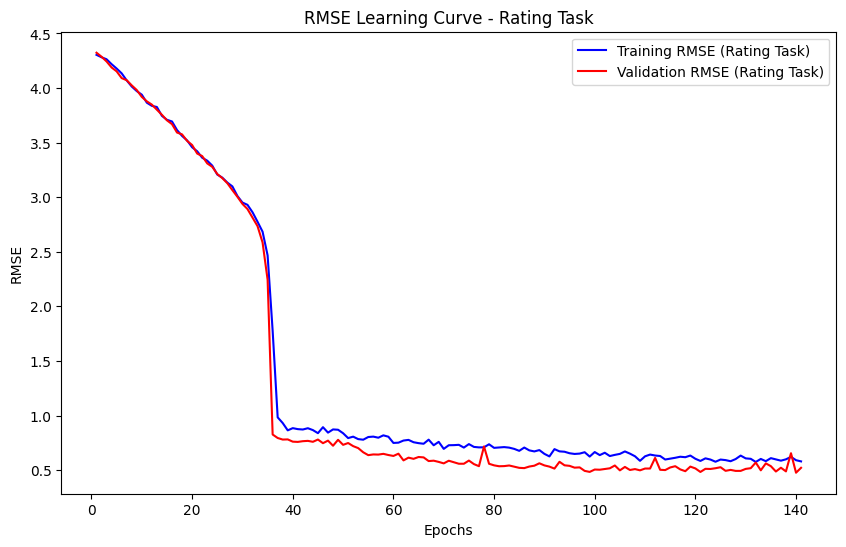

In [23]:
print(history.history.keys())

# Extract RMSE metrics from history
rating_rmse = history.history['rating_model_rating_rmse']
val_rating_rmse = history.history['val_rating_model_rating_rmse']

epochs_x = range(1, len(rating_rmse) + 1)

# Plot the RMSE learning curves for the rating task
plt.figure(figsize=(10, 6))
plt.plot(epochs_x, rating_rmse, 'b', label='Training RMSE (Rating Task)')
plt.plot(epochs_x, val_rating_rmse, 'r', label='Validation RMSE (Rating Task)')
plt.title('RMSE Learning Curve - Rating Task')
plt.xlabel('Epochs')
plt.ylabel('RMSE')
plt.legend()
plt.show()

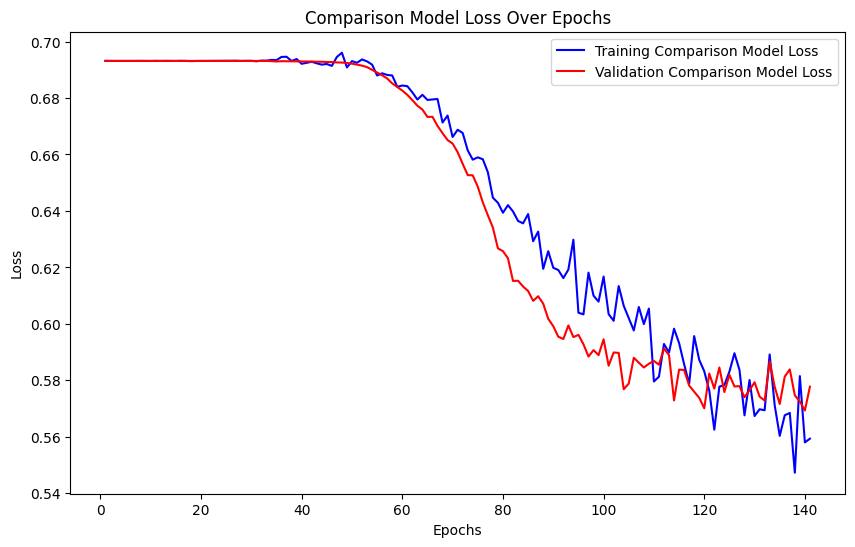

In [24]:
# Extract the comparison model loss from the history object
comparison_model_loss = history.history['comparison_model_loss']
val_comparison_model_loss = history.history['val_comparison_model_loss']

# Plot the comparison model loss over the epochs
epochs_x = range(1, len(comparison_model_loss) + 1)

plt.figure(figsize=(10, 6))
plt.plot(epochs_x, comparison_model_loss, 'b', label='Training Comparison Model Loss')
plt.plot(epochs_x, val_comparison_model_loss, 'r', label='Validation Comparison Model Loss')
plt.title('Comparison Model Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

Display the learning curves of the comparison task.


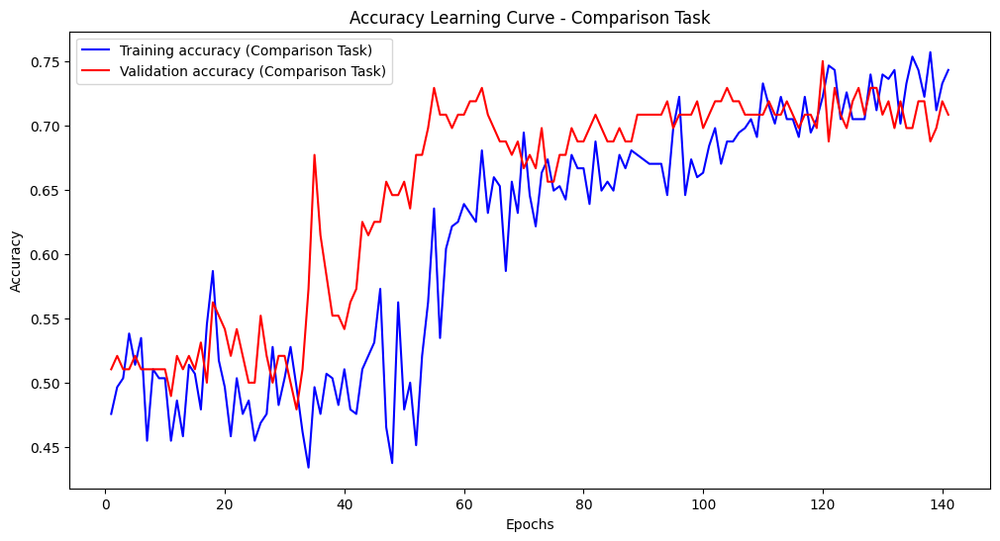

In [25]:
# Extract RMSE metrics from history
comparison_output_custom_binary_accuracy = history.history['comparison_model_custom_binary_accuracy']
val_comparison_output_custom_binary_accuracy = history.history['val_comparison_model_custom_binary_accuracy']


epochs_x = range(1, len(comparison_output_custom_binary_accuracy) + 1)

# Plot the RMSE learning curves for the comparison task
plt.figure(figsize=(12, 6))
plt.plot(epochs_x, comparison_output_custom_binary_accuracy, 'b', label='Training accuracy (Comparison Task)')
plt.plot(epochs_x, val_comparison_output_custom_binary_accuracy, 'r', label='Validation accuracy (Comparison Task)')
plt.title('Accuracy Learning Curve - Comparison Task')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

Define a function that calculates Pearson correlation.


In [26]:
from scipy import stats

def pearsonr_ci(x,y,alpha=0.05):
    ''' calculate Pearson correlation along with the confidence interval using scipy and numpy
    Parameters
    ----------
    x, y : iterable object such as a list or np.array
      Input for correlation calculation
    alpha : float
      Significance level. 0.05 by default
    Returns
    -------
    r : float
      Pearson's correlation coefficient
    pval : float
      The corresponding p value
    lo, hi : float
      The lower and upper bound of confidence intervals
    '''
    N = len(x)
    r, p = stats.pearsonr(x,y)
    r_z = np.arctanh(r)
    se = 1/np.sqrt(N-3)
    z = stats.norm.ppf(1-alpha/2)
    lo_z, hi_z = r_z-z*se, r_z+z*se
    lo, hi = np.tanh((lo_z, hi_z))
    return r, p, lo, hi

Predict the scores for the images in the testing set. Display the predictions of the first 6 images.


In [28]:
# Rating Model
rating_predictions = []

X_val = X_val / 255.0
for img in X_val:
  img = img.reshape(1, 192, 256, 3)
  pred = rating_model.predict(img)
  rating_predictions.append(float(pred))

rating_predictions = np.array(rating_predictions)


1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_1581662/144748134.py:8: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 19ms/step


Display some websites of the test set and the predicted aesthetics score.


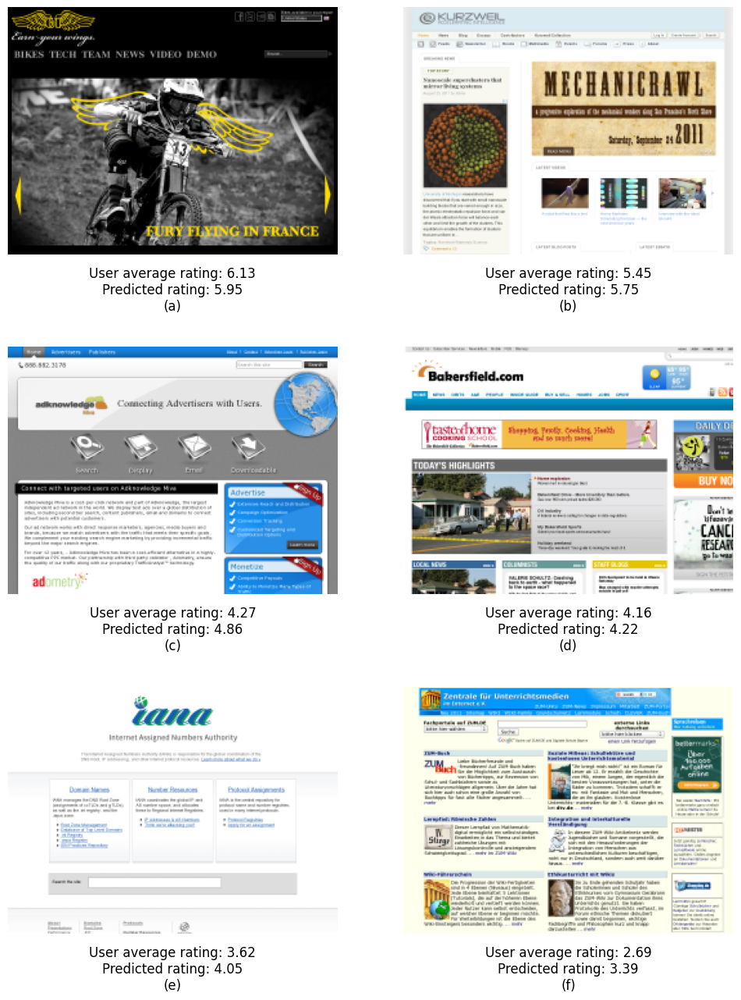

In [29]:
image_ids = [87, 45, 49, 94, 14, 83] # test image IDs sorted in descending order according to the website's aesthetics level

fig = plt.figure(figsize=(12, 16))
i = 1
for id in image_ids:
  if 'english' in test_images[id]:
    path = images_path + '/english_resized/' + test_images[id].rsplit('/', 1)[1]
  else:
    path = images_path + '/foreign_resized/' + test_images[id].rsplit('/', 1)[1]

  plt.subplot(len(image_ids)//2, 2, i)
  img = mping.imread(path)
  plt.title('User average rating: ' + str(np.round(y_val[id],2)) + '\nPredicted rating: ' + str(np.round(rating_predictions[id],2)) + '\n(' + chr(97+i-1) + ')', y=-0.25)
  plt.axis('off')
  plt.imshow(img)

  i += 1

plt.show()

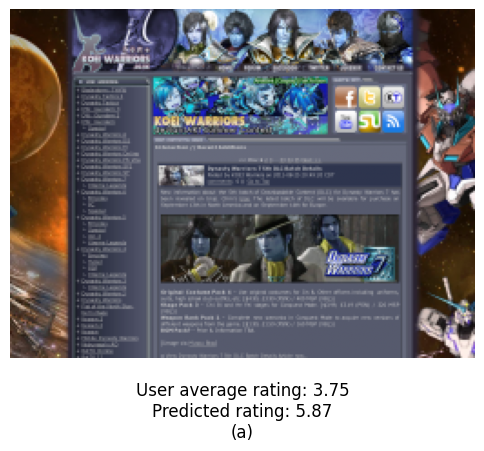

In [32]:
# Assuming y_val and rating_predictions are already defined
# Find the index of the image with the largest difference
difference = np.abs(y_val - rating_predictions)
id = np.argmax(difference)

# Plot the image with the largest difference
img_with_max_diff = X_val[id]  # Get the corresponding image

plt.figure(figsize=(6, 8))
plt.imshow(img_with_max_diff)
plt.axis('off')  # Turn off axis

# Set the title as specified
plt.title('User average rating: ' + str(np.round(y_val[id], 2)) + 
          '\nPredicted rating: ' + str(np.round(rating_predictions[id], 2)) + 
          '\n(' + chr(97) + ')', y=-0.25)

# Show the plot
plt.show()

Image with the lowest discrepancy between the predicted and the ground-truth value


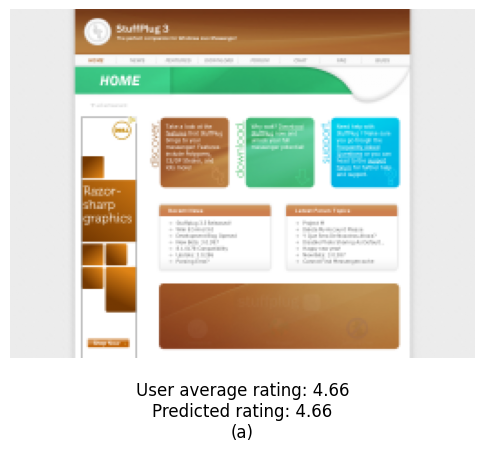

In [33]:
id = np.argmin(difference)

# Plot the image with the smallest difference
img_with_min_diff = X_val[id]  # Get the corresponding image

plt.figure(figsize=(6, 8))
plt.imshow(img_with_min_diff)
plt.axis('off')  # Turn off axis

# Set the title as specified
plt.title('User average rating: ' + str(np.round(y_val[id], 2)) + 
          '\nPredicted rating: ' + str(np.round(rating_predictions[id], 2)) + 
          '\n(' + chr(97) + ')', y=-0.25)

# Show the plot
plt.show()

Display images


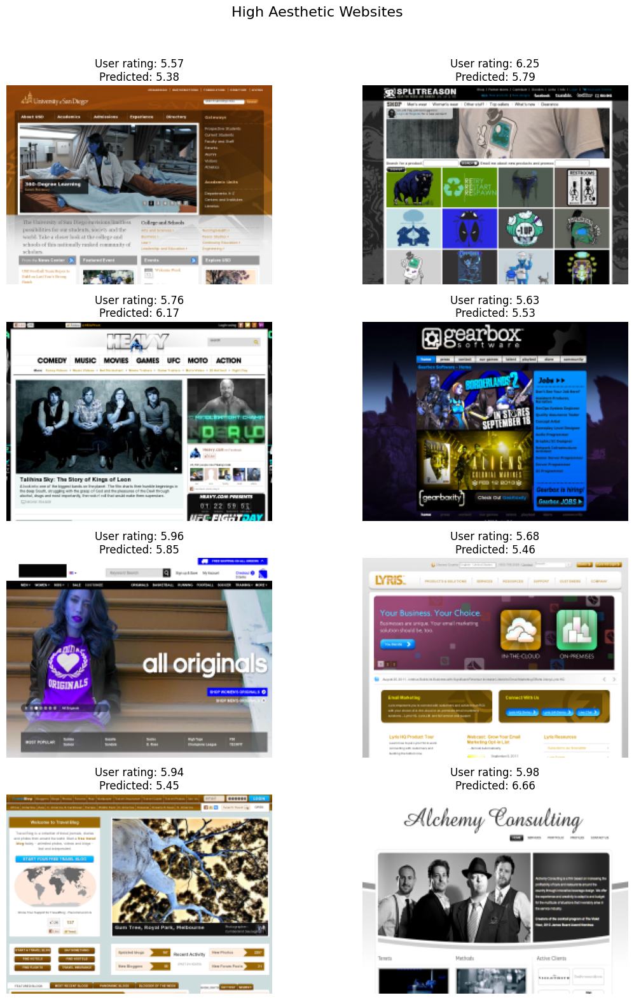

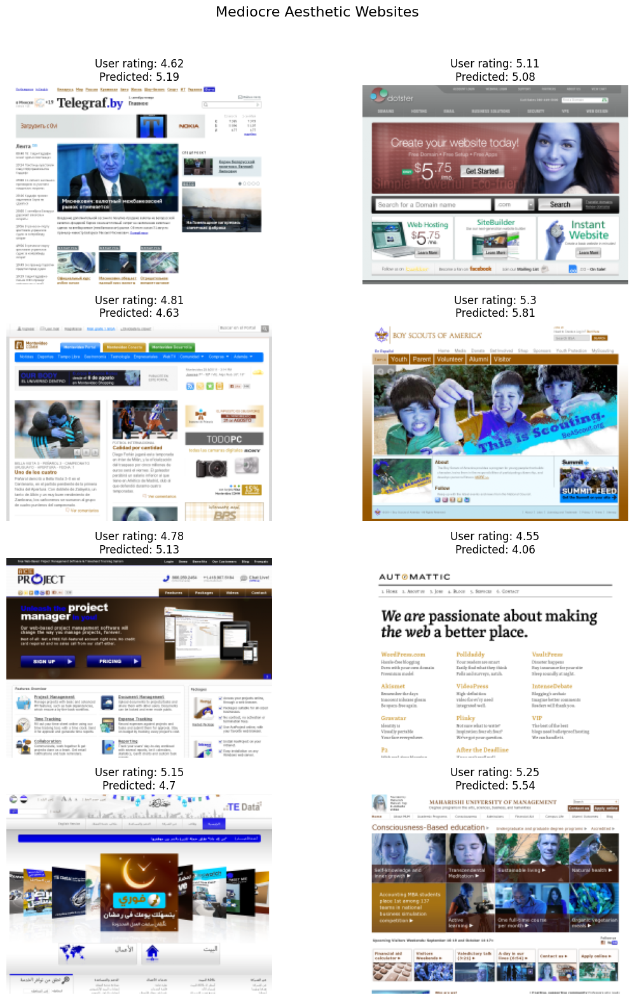

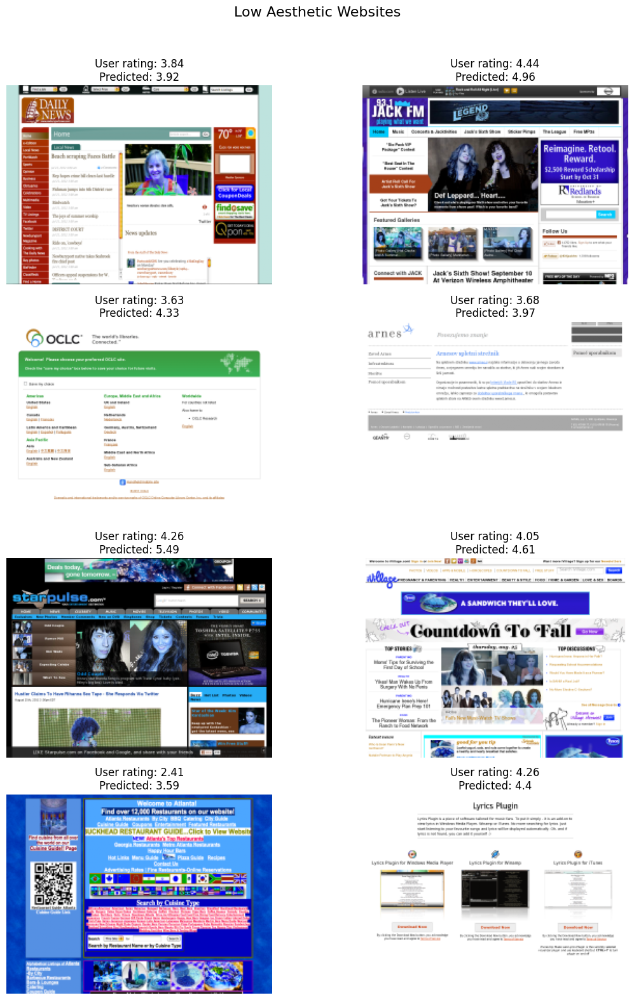

In [34]:

# Define the categories based on y_val
categories = {
    'High Aesthetic': np.where(y_val > 5.5)[0],
    'Mediocre Aesthetic': np.where((y_val >= 4.5) & (y_val <= 5.5))[0],
    'Low Aesthetic': np.where(y_val < 4.5)[0]
}

# Function to plot images in a grid
def plot_images_in_grid(indices, title):
    fig, axes = plt.subplots(4, 2, figsize=(12, 16))
    fig.suptitle(title, fontsize=16)
    
    for i, ax in enumerate(axes.flat):
        if i < len(indices):
            idx = indices[i]
            ax.imshow(X_val[idx])
            ax.axis('off')
            ax.set_title(f'User rating: {np.round(y_val[idx], 2)}\nPredicted: {np.round(rating_predictions[idx], 2)}')
        else:
            ax.axis('off')
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# Plot for each category
for category, indices in categories.items():
    if len(indices) >= 8:
        selected_indices = indices[:8]  # Select the first 8 images
    else:
        selected_indices = indices  # If fewer than 8, select all available
    
    plot_images_in_grid(selected_indices, f'{category} Websites')

1/1 [==============================] - 0s 40ms/step


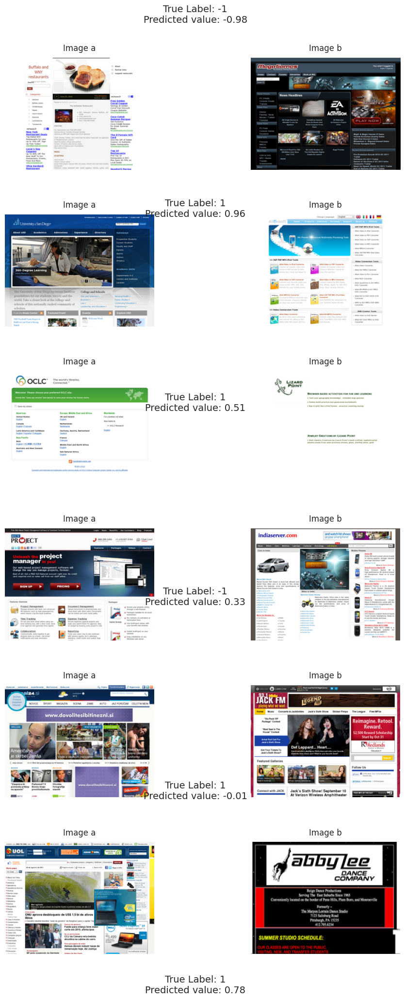

Custom Binary Accuracy: 0.6984127163887024


In [47]:
# # Comparison Model

# Normalize image pairs
def normalize_image_pairs(X_pairs):
    normalized_pairs = []
    for img1, img2 in X_pairs:
        img1_normalized = img1 / 255.0
        img2_normalized = img2 / 255.0
        normalized_pairs.append((img1_normalized, img2_normalized))
    return normalized_pairs

# Normalize the validation image pairs
X_pairs_val_normalized = normalize_image_pairs(X_pairs_val)

# Predict
comparison_predictions = []
num_batches = len(X_pairs_val_normalized) // batch_size


for i in range(num_batches):
    batch_pairs = X_pairs_val_normalized[i * batch_size:(i + 1) * batch_size]
    img1_batch = np.array([pair[0] for pair in batch_pairs])
    img2_batch = np.array([pair[1] for pair in batch_pairs])
    
    # Predict
    preds = comparison_model.predict([img1_batch, img2_batch])
    comparison_predictions.extend(preds.flatten())

# Handle remaining pairs if the number of pairs is not a multiple of batch_size
if len(X_pairs_val_normalized) % batch_size != 0:
    batch_pairs = X_pairs_val_normalized[num_batches * batch_size:]
    img1_batch = np.array([pair[0] for pair in batch_pairs])
    img2_batch = np.array([pair[1] for pair in batch_pairs])
    
    # Predict
    preds = comparison_model.predict([img1_batch, img2_batch])
    comparison_predictions.extend(preds.flatten())

comparison_predictions = np.array(comparison_predictions)


# for img1, img2 in X_pairs_val_normalized:
#     # Add batch dimension
#     img1_normalized = np.expand_dims(img1, axis=0)
#     img2_normalized = np.expand_dims(img2, axis=0)
    
#     # Predict
#     pred = comparison_model.predict([img1_normalized, img2_normalized])
#     comparison_predictions.append(float(pred[0][0]))

# comparison_predictions = np.array(comparison_predictions)

# # Pick random pairs
# num_pairs_to_display = 6  # Number of pairs to display
# pair_ids = random.sample(range(len(X_pairs_val)), num_pairs_to_display)

# Manually select specific IDs
manual_pair_ids = [24, 56, 62, 45, 16, 87]  # Replace with desired IDs

# Plotting
fig, axes = plt.subplots(len(manual_pair_ids), 2, figsize=(12, len(manual_pair_ids) * 4))
fig.subplots_adjust(hspace=0.4)
i = 0
for idx, id in enumerate(manual_pair_ids):
    img1, img2 = X_pairs_val[id]
    
    # Plot first image of the pair
    axes[idx, 0].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    axes[idx, 0].axis('off')
    axes[idx, 0].set_title('Image a', fontsize=12, pad=10)
    
    # Plot second image of the pair
    axes[idx, 1].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    axes[idx, 1].axis('off')
    axes[idx, 1].set_title('Image b', fontsize=12, pad=10)
    
    # Add text with the true label and predicted value in the middle between the images
    fig.text(0.5, (len(manual_pair_ids) - idx - 0.5) / len(manual_pair_ids), 
             f'True Label: {y_pairs_val[id]}\nPredicted value: {comparison_predictions[id]:.2f}', 
             ha='center', va='center', fontsize=14)

plt.show()


# Calculate custom binary accuracy
accuracy = custom_binary_accuracy(y_pairs_val, comparison_predictions)

print(f"Custom Binary Accuracy: {accuracy.numpy()}")

Create a scatterplot to check the relationship between ground truth and predicted scores.


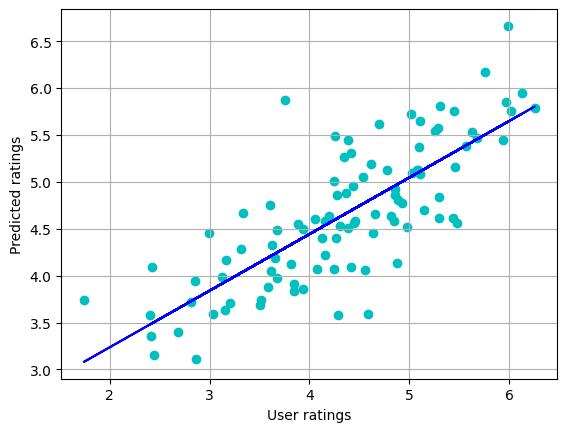

In [36]:
from numpy.polynomial.polynomial import polyfit
b, m = polyfit(y_val, rating_predictions, 1)

fig = plt.figure()
plt.scatter(y_val, rating_predictions, c='c')
plt.plot(y_val, b + m * y_val, '-', c='b')
plt.xlabel('User ratings')
plt.ylabel('Predicted ratings')

# Add grid
plt.grid(True)

plt.show()

Calculate the Pearson correlation and the RMSE between ground truth and predicted scores.


In [37]:
from sklearn.metrics import mean_squared_error
from math import sqrt

corr, p, lo, hi = pearsonr_ci(y_val, rating_predictions)
print('Pearsons correlation: r=%.4f, p=%.2e, CI=[%.2f, %.2f]' % (corr, p, lo, hi))
rmse_test = sqrt(mean_squared_error(y_val, rating_predictions))
print('RMSE: %.3f' % rmse_test)

Pearsons correlation: r=0.7829, p=1.69e-21, CI=[0.69, 0.85]
RMSE: 0.672


In [38]:
# # Comparison Model

# Normalize image pairs
def normalize_image_pairs(X_pairs):
    normalized_pairs = []
    for img1, img2 in X_pairs:
        img1_normalized = img1 / 255.0
        img2_normalized = img2 / 255.0
        normalized_pairs.append((img1_normalized, img2_normalized))
    return normalized_pairs


# Normalize the validation image pairs
X_pairs_val_normalized = normalize_image_pairs(X_pairs_val)

# Predict
comparison_predictions = []

for img1, img2 in X_pairs_val_normalized:
    # Add batch dimension
    img1_normalized = np.expand_dims(img1, axis=0)
    img2_normalized = np.expand_dims(img2, axis=0)
    
    # Predict
    pred = comparison_model.predict([img1_normalized, img2_normalized])
    comparison_predictions.append(float(pred[0][0]))

comparison_predictions = np.array(comparison_predictions)

# Calculate custom binary accuracy
accuracy = custom_binary_accuracy(y_pairs_val, comparison_predictions)

print(f"Custom Binary Accuracy: {accuracy.numpy()}")




1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 20ms/step
Custom Binary Accuracy: 0.6984127163887024


Plot the distribution of ground truth scores and the distribution of predictions.


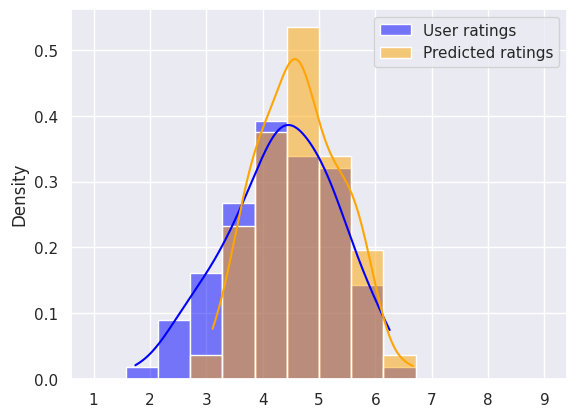

In [39]:
import seaborn as sns

fig = plt.figure()
sns.set_theme(color_codes=True)

bins = np.linspace(1, 9, num=15)

# sns.displot(y_val, bins=bins, label='User ratings', kde=True)

# sns.displot(rating_predictions, bins=bins, label='Predicted ratings', kde=True)
# Plot the distributions on the same figure
sns.histplot(y_val, bins=bins, label='User ratings', kde=True, color='blue', stat="density", alpha=0.5)
sns.histplot(rating_predictions, bins=bins, label='Predicted ratings', kde=True, color='orange', stat="density", alpha=0.5)

plt.legend()

plt.show()


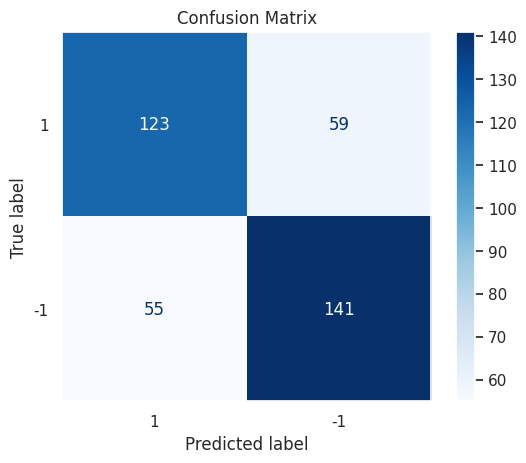

In [40]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
comparison_predictions
# Use 0.0 as the threshold for tanh output
comparison_predictions = tf.where(comparison_predictions >= 0.0, 1.0, -1.0)  # Convert predictions to 1 or -1


# Assuming y_true and y_pred are your true labels and predictions
cm = confusion_matrix(y_pairs_val, comparison_predictions, labels=[1, -1])
# Plot confusion matrix without grid lines
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[1, -1])
fig, ax = plt.subplots()
disp.plot(cmap=plt.cm.Blues, ax=ax)
ax.grid(False)  # Turn off grid lines
plt.title('Confusion Matrix')
plt.show()

TESTTTTTTTTTTTTt


In [41]:
# # import math


# #Combined loss function
# def ONEPAIRLOSSCOMBINED(y_true, y_pred, alpha=0.5):
#     # Split y_true and y_pred
#     y_true_rating = y_true[0]
#     y_true_comparison = y_true[1]
#     y_pred_rating = y_pred[0]
#     y_pred_comparison = y_pred[1]

#     y_true_rating = tf.cast(y_true_rating, tf.float32)
#     y_true_comparison = tf.cast(y_true_comparison, tf.float32)

#     D_a = tf.cast(tf.size(y_true_rating), tf.float32)
#     D_b = tf.cast(tf.size(y_true_comparison), tf.float32)

#     loss_a = mse_regression_loss(y_true_rating, y_pred_rating)
#     loss_p = bradley_terry_loss(y_true_comparison, y_pred_comparison)

#     L_combined = alpha * (1 / D_a) * loss_a + (1 - alpha) * (1 / D_b) * loss_p
#     return L_combined

# def ONEPAIRLOSS(y_true, y_pred):
#     print(f"y_true shape: {y_true.shape}")
#     print(f"y_pred shape: {y_pred.shape}")

#     y_true_rating = y_true[0]
#     y_true_comparison = y_true[1]
#     y_pred_rating = y_pred[0]
#     y_pred_comparison = y_pred[1]

#     return ONEPAIRLOSSCOMBINED((y_true_rating, y_true_comparison), (y_pred_rating, y_pred_comparison), alpha=0.5)


# joint_model.compile(loss=ONEPAIRLOSS, optimizer=adam_optimizer,
#                     metrics={
#     'rating_output' : [rating_rmse],
#     'comparison_output' : [custom_binary_accuracy]
#      })


# # Define a function to limit the dataset to 20 samples and repeat it
# def limit_and_repeat_dataset(dataset, num_samples, repeat_count):
#     limited_dataset = dataset.take(num_samples)
#     repeated_dataset = limited_dataset.repeat(repeat_count)
#     return repeated_dataset


# # # Limit the dataset to 20 samples
# # limited_combined_gen_train = combined_gen_train.take(20)
# # # Limit the dataset to 20 samples
# # limited_combined_gen_val = combined_gen_val.take(20)

# # Assuming combined_gen_train and combined_gen_val are defined datasets
# # Limit and repeat the training and validation datasets
# repeat_count =200  # Adjust as needed
# limited_combined_gen_train = limit_and_repeat_dataset(combined_gen_train, 20,repeat_count)
# limited_combined_gen_val = limit_and_repeat_dataset(combined_gen_val, 20,repeat_count)

# # Optional: Verify the number of samples by iterating through the dataset
# count = 0
# for _ in limited_combined_gen_train:
#     count += 1

# print(f"Number of samples in limited dataset: {count}")

# batch_size = 10

# # # Debugging step to confirm shapes
# # print(f"single_image shape: {single_image.shape}")
# # print(f"single_pair_images shape: {single_pair_images.shape}")
# # print(f"single_image shape: {single_image.shape}")
# # print(f"single_pair_image_a shape: {single_pair_image_a.shape}")
# # print(f"single_pair_image_b shape: {single_pair_image_b.shape}")
# # print(f"single_label shape: {single_label.shape}")
# # print(f"single_pair_label shape: {single_pair_label.shape}")

# # Train the model using the limited dataset
# history = joint_model.fit(
#     limited_combined_gen_train,
#     steps_per_epoch=(5*20) // batch_size,
#     epochs=70,  # Use a small number of epochs for testing
#     validation_data=limited_combined_gen_val,
#     validation_steps=(5*20) // batch_size
# )


# # def single_image_rating_generator(image, label, batch_size):
# #     while True:
# #         batch_images = np.repeat(image[np.newaxis, :], batch_size, axis=0)
# #         batch_labels = np.repeat(label, batch_size)
# #         yield batch_images, batch_labels

# # def single_pair_comparison_generator(pair_images, label, batch_size):
# #     while True:
# #         batch_images_1 = np.repeat(pair_images[0][np.newaxis, :], batch_size, axis=0)
# #         batch_images_2 = np.repeat(pair_images[1][np.newaxis, :], batch_size, axis=0)
# #         batch_labels = np.repeat(label, batch_size)
# #         yield (batch_images_1, batch_images_2), batch_labels


# # def combined_single_data_generator(single_image, single_image_label, pair_images, pair_label, batch_size):
# #     rating_gen = single_image_rating_generator(single_image, single_image_label, batch_size)
# #     comparison_gen = single_pair_comparison_generator(pair_images, pair_label, batch_size)
    
# #     while True:
# #         rating_batch = next(rating_gen)
# #         comparison_batch = next(comparison_gen)
        
# #         combined_images = (
# #             rating_batch[0],
# #             comparison_batch[0][0],
# #             comparison_batch[0][1]
# #         )
# #         combined_labels = (
# #             rating_batch[1],
# #             comparison_batch[1]
# #         )
# #         yield combined_images, combined_labels


# # combined_gen_single = tf.data.Dataset.from_generator(
# #     lambda: combined_single_data_generator(single_image, single_image_label, pair_images, pair_label, batch_size),
# #     output_signature=(
# #         (
# #             tf.TensorSpec(shape=(None, 192, 256, 3), dtype=tf.float32),
# #             tf.TensorSpec(shape=(None, 192, 256, 3), dtype=tf.float32),
# #             tf.TensorSpec(shape=(None, 192, 256, 3), dtype=tf.float32)
# #         ),
# #         (
# #             tf.TensorSpec(shape=(None,), dtype=tf.float32),
# #             tf.TensorSpec(shape=(None,), dtype=tf.float32)
# #         )
# #     )
# # )

In [42]:
# print(history.history.keys())

# # Extract RMSE metrics from history
# rating_rmse = history.history['rating_output_rating_rmse']
# val_rating_rmse = history.history['val_rating_output_rating_rmse']

# epochs_x = range(1, len(rating_rmse) + 1)

# # Plot the RMSE learning curves for the rating task
# plt.figure(figsize=(10, 6))
# plt.plot(epochs_x, rating_rmse, 'b', label='Training RMSE (Rating Task)')
# plt.plot(epochs_x, val_rating_rmse, 'r', label='Validation RMSE (Rating Task)')
# plt.title('RMSE Learning Curve - Rating Task')
# plt.xlabel('Epochs')
# plt.ylabel('RMSE')
# plt.legend()
# plt.show()


# # Plot both Heads simeltaneously
# # plt.figure(figsize=(12, 6))

# # plt.subplot(1, 2, 1)
# # plt.plot(rating_rmse, label='Training RMSE')
# # plt.plot(val_rating_rmse, label='Validation RMSE')
# # plt.xlabel('Epochs')
# # plt.ylabel('RMSE')
# # plt.title('Rating RMSE')
# # plt.legend()

# # plt.subplot(1, 2, 2)
# # plt.plot(comparison_rmse, label='Training RMSE')
# # plt.plot(val_comparison_rmse, label='Validation RMSE')
# # plt.xlabel('Epochs')
# # plt.ylabel('RMSE')
# # plt.title('Comparison RMSE')
# # plt.legend()

# # plt.show()

Image with the biggest discrepancy between the predicted and the ground-truth value
